# Dependencies

In [1]:
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
from czifile import * # for loading lsm-files
import tifffile as tiff
import numpy as np
import os
from os import listdir
from os.path import isfile, isdir, join
import pandas as pd
import seaborn as sns

import scipy.stats
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
import math
import anndata as ad
from scipy.sparse import csr_matrix

import scipy.optimize as opt

import sys,os
from matplotlib import colors
from matplotlib import cm as cmx
from tqdm import tqdm 

from Code import Main_v2
from Code import Plate_Plotter
from Code.Plate_Viz import *
from Code.Quality_Control import *

# Data Import

In [2]:
Experiment = "Exp_22"
By="JJ"
# Read directly from plate file
# Data_dir = "Data/Plate_Analysis/"+Experiment+"_MFI values.xlsx"
# Nuclei_dir = "Data/Plate_Analysis/"+Experiment+"_Nuclei.xlsx"
# Plate_dir = "Data/Plate_Analysis/XW4_Plates.xlsx"
Data_dir = "Data/JJ/Experiments/"+Experiment+"_MFI values.xlsx"
Nuclei_dir = "Data/JJ/Experiments/"+Experiment+"_Nuclei.xlsx"
Plate_dir = "Data/JJ/JJ_Plates.xlsx"
Results_Folder="Results/"


In [3]:
Main_Object= Main_v2.Main(dataframe_dir = Data_dir, 
                          plate_dir     = Plate_dir,
                          nuclei_dir    = Nuclei_dir,
                          data_df       =  None,
                          plate_df      =  None,
                          nuclei_df     = None,
                          Experiment    = Experiment, 
                                By      = By)

Text(0.5, 1.0, 'Nuclei numbers')

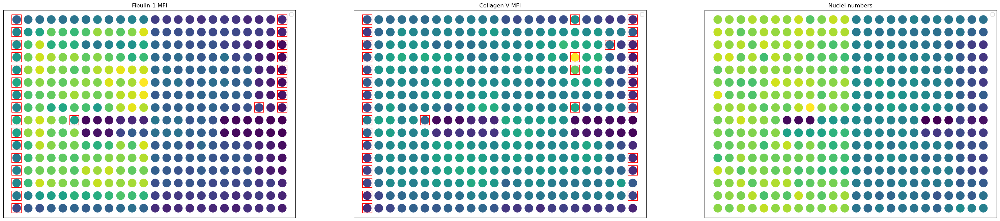

In [4]:
fig, axes = plt.subplots(1,3, figsize = (38, 8)) 

Main_Object.visualize_plate("Fibulin",
                       outlier_detection=True,ax=axes[0])
axes[0].set_title("Fibulin-1 MFI",fontsize=12)

Main_Object.visualize_plate("ECM",
                       outlier_detection=True,ax=axes[1])
axes[1].set_title("Collagen V MFI",fontsize=12)

Main_Object.visualize_plate("Nuclei",
                       outlier_detection=True,ax=axes[2])
axes[2].set_title("Nuclei numbers",fontsize=12)

#plt.savefig(f"{Results_Folder}/Plots/Plates_Visualized.png", bbox_inches='tight')

# Nuclei LD50 Set up

In [5]:
OG,processed_plate = Main_Object.get_plate("Nuclei",
                       outlier_detection=True)

from Code.Plate_Plotter import *
norm_nuc_mat = HighLow_Nuc_Normalization(plate= processed_plate)

In [6]:
updated_df = Main_Object.integration_call(norm_nuc_mat,
                         "Nuclei",
                         "HighLow")

In [7]:
_,_,nuc_result_df = nuclei_curves(updated_df,"PL4")




In [8]:

nuc_result_df

,Compound name,Replicate,Cell Line,Stain,LD50,SE,Hill_Slope,Rsq,MSE,n_points,unique_doses,unique_responses,resp_std
0,Cinoxacin,1,MLT018,Nuclei,1271.704989,NaN,1.0,0.012769,66.787440,18,6,15,6.113818
1,Cinoxacin,1,MLT069,Nuclei,362.754155,NaN,1.0,0.604055,36.122607,18,6,17,6.650671
2,cmp18,1,MLT018,Nuclei,430.280255,NaN,1.0,0.284953,61.563086,18,6,18,4.998969
3,cmp18,1,MLT069,Nuclei,67.333666,NaN,1.0,0.229929,565.974236,18,6,18,13.951834
4,Flumequine,1,MLT018,Nuclei,981.344141,NaN,1.0,0.012184,46.576700,18,6,15,5.158250
5,Flumequine,1,MLT069,Nuclei,355.345043,NaN,1.0,0.605302,35.428325,18,6,15,7.280700
6,HLM-01-196,1,MLT018,Nuclei,150.935691,NaN,1.0,0.721689,105.336641,18,6,18,10.642717
7,HLM-01-196,1,MLT069,Nuclei,20.427437,NaN,1.0,0.581511,548.536370,18,6,18,16.891177
8,Nalidixic Acid,1,MLT018,Nuclei,1573.083352,NaN,1.0,0.042067,56.100574,18,6,15,5.363224
9,Nalidixic Acid,1,MLT069,Nuclei,2979.780558,NaN,1.0,0.301817,78.838082,18,6,17,5.959983


In [9]:
OG,processed_plate = Main_Object.get_plate("Fibulin",
                       outlier_detection=True)
QC_Fib = QC_Zfactor(processed_plate,Experiment,By)

display("Fibulin")
display("Z Score for Left Side of the Plate: Top:"+str(QC_Fib["Z_LHS_l"][0][0])+" Bottom:"+str(QC_Fib["Z_LHS_l"][0][1]))
display("Z Score for Right Side of the Plate:"+str(QC_Fib["Z_RHS_l"][0][0])+" Bottom:"+str(QC_Fib["Z_RHS_l"][0][1]))

QC_CautionDisplayer(QC_Fib)

'Fibulin'

'Z Score for Left Side of the Plate: Top:0.25661983380750963 Bottom:0.25065986236004234'

'Z Score for Right Side of the Plate:-0.614039069143185 Bottom:-1.0566976867789672'

'!! DONOT USE TOP-RHS SIDE!!'

'!! DONOT USE BOTTOM-RHS SIDE!!'

In [35]:
QC_Fib

,Experiment,By,Mean_ZF,Mean_ZF_l,Z_LHS,Z_RHS,Z_LHS_l,Z_RHS_l
0,Exp_22,JJ,-0.936296,-0.290864,"[-0.11507024928873544, -0.12401020645993666]","[-1.4210586037147777, -2.0850465301684507]","[0.25661983380750963, 0.25065986236004234]","[-0.614039069143185, -1.0566976867789672]"


In [10]:
OG,processed_plate = Main_Object.get_plate("ECM",
                       outlier_detection=True)
QC_Col = QC_Zfactor(processed_plate,Experiment,By)
display("Collagen V")
display("Z Score for Left Side of the Plate: Top:"+str(QC_Col["Z_LHS_l"][0][0])+" Bottom:"+str(QC_Col["Z_LHS_l"][0][1]))
display("Z Score for Right Side of the Plate:Top:"+str(QC_Col["Z_RHS_l"][0][0])+" Bottom:"+str(QC_Col["Z_RHS_l"][0][1]))


QC_CautionDisplayer(QC_Col)

'Collagen V'

'Z Score for Left Side of the Plate: Top:-1.9506067253630488 Bottom:-1.7998044504905333'

'Z Score for Right Side of the Plate:Top:0.40781358189493955 Bottom:0.5887818199533212'

'!! DONOT USE TOP-LEFT SIDE!!'

'!! DONOT USE BOTTOM-LEFT SIDE!!'

In [11]:
Fibulin_df = Main_Object.normalized_dataframe("Fibulin")
Collagen_df = Main_Object.normalized_dataframe("ECM")

In [12]:
if len(Fibulin_df["Cell line"].unique())==1:
    Fib_split1 = Fibulin_df[Fibulin_df["Replicate"]==1]
    Fib_split2 = Fibulin_df[Fibulin_df["Replicate"]==2]
    Col_split1 = Collagen_df[Collagen_df["Replicate"]==1]
    Col_split2 = Collagen_df[Collagen_df["Replicate"]==2]
else:
    Fib_split1 = Fibulin_df[Fibulin_df["Cell line"]==Fibulin_df["Cell line"][0]]
    Fib_split2 = Fibulin_df[Fibulin_df["Cell line"]==Fibulin_df["Cell line"][1]]
    Col_split1 = Collagen_df[Collagen_df["Cell line"]==Collagen_df["Cell line"][0]]
    Col_split2 = Collagen_df[Collagen_df["Cell line"]==Collagen_df["Cell line"][1]]

In [13]:
plots,_,res_var_1 = plate_curve_generator(Fib_split1,
                          Col_split1, 
                          "Var",
                          "HighLow",
                          "MFI/Nuc", 
                          #tolerance  =  1e-6,
                          ylim = (0,110),
                          save_values = True,
                         display_plot = True
                         )
plt.savefig(f"{Results_Folder}/Plots/HighLow_Variable_Plot_LHS.png", bbox_inches='tight')
res_var_1.to_csv(f"{Results_Folder}/Plots/HighLow_Variable_Results_LHS.csv", index=False)


Curve fitting raised an error for Nalidixic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Nalidixic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Oxolinic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Piromidic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Piromidic Acid: Cannot calculate a linear regression if all x values are identical



In [14]:
plots,_,res_var_2 = plate_curve_generator(Fib_split2,
                          Col_split2, 
                          "Var",
                          "HighLow",
                          "MFI/Nuc", 
                          #tolerance  =  1e-6,
                          ylim = (0,110),
                          save_values = True
                         )
plt.savefig(f"{Results_Folder}/Plots/HighLow_Variable_Plot_RHS.png", bbox_inches='tight')
res_var_2.to_csv(f"{Results_Folder}/Plots/HighLow_Variable_Results_RHS.csv", index=False)


Curve fitting raised an error for Nalidixic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Nalidixic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Oxolinic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Piromidic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Piromidic Acid: Cannot calculate a linear regression if all x values are identical



# HighLow PL4

In [15]:
plots,_,res_PL4_1 = plate_curve_generator(Fib_split1,
                          Col_split1, 
                          "PL4",
                          "HighLow",
                          "MFI/Nuc", 
                          #tolerance  =  1e-6,
                          ylim = (0,110),
                          save_values = True
                         )
plt.savefig(f"{Results_Folder}/Plots/HighLow_PL4_Plot_LHS.png", bbox_inches='tight')

Curve fitting raised an error for Nalidixic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Nalidixic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Oxolinic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Piromidic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Piromidic Acid: Cannot calculate a linear regression if all x values are identical



In [16]:
plots,_,res_PL4_2 = plate_curve_generator(Fib_split2,
                          Col_split2, 
                          "PL4",
                          "HighLow",
                          "MFI/Nuc", 
                          #tolerance  =  1e-6,
                          ylim = (0,110),
                          save_values = True
                         )

plt.savefig(f"{Results_Folder}/Plots/HighLow_PL4_Plot_RHS.png", bbox_inches='tight')

Curve fitting raised an error for Nalidixic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Nalidixic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Oxolinic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Piromidic Acid: Cannot calculate a linear regression if all x values are identical

Curve fitting raised an error for Piromidic Acid: Cannot calculate a linear regression if all x values are identical



# Result DFs

# IC50s

In [17]:
result_df = Plate_IC50s(res_var_1,res_var_2,res_PL4_1,res_PL4_2,
                        Fibulin_df,Experiment,By)
result_df.to_csv(f"{Results_Folder}/Plots/results_df", index=False)

In [29]:
result_df.shape

(44, 13)

In [18]:
result_df.head()

,IC50,SE,Hill_Slope,Rsq,MSE,Compound name,Stain,Cell line,Replicate,Curve_Type,Experiment,By,Norm_Type
0,4.869099e-02,NaN,2.939650,0.071330,105.155933,Cinoxacin,Fibulin,MLT018,1,Var,Exp_22,JJ,HighLow
1,6.592777e-04,NaN,0.308608,0.158243,170.327771,Cinoxacin,ECM,MLT018,1,Var,Exp_22,JJ,HighLow
2,4.696073e-286,NaN,0.003493,0.364184,341.499438,cmp18,Fibulin,MLT018,1,Var,Exp_22,JJ,HighLow
3,1.544872e-246,NaN,0.003486,0.187125,360.686810,cmp18,ECM,MLT018,1,Var,Exp_22,JJ,HighLow
4,6.667082e-136,NaN,0.004092,0.059693,1373.764246,Flumequine,Fibulin,MLT018,1,Var,Exp_22,JJ,HighLow


# QC

In [ ]:
plate_df = pd.read_excel(Plate_dir,index_col=0) # read plate map
plate_df = plate_df[plate_df["Experiment"]==Experiment].reset_index(drop=True)

QC_Fib2 = Z_factor_Plate_df_Merging(plate_df,QC_Fib,"Fibulin")
QC_Col2  =Z_factor_Plate_df_Merging(plate_df,QC_Col,"ECM")

QC_final = pd.merge(QC_Fib2,QC_Col2, on=["Experiment", "Compound name","well_col","plate_loc","Replicate",
                                                  "Cell line","By"])
QC_final["Z_Factor_l_Mean"] = (QC_final["Z_Factor_l_Fibulin"]+QC_final["Z_Factor_l_ECM"])/2
QC_final["Z_Factor_Mean"] = (QC_final["Z_Factor_l_Fibulin"]+QC_final["Z_Factor_ECM"])/2

QC_final.rename(columns=lambda x: x.replace('_Fibulin', '_Fib').replace('_ECM', '_Col'), inplace=True)
QC_final = QC_in_text(QC_final)

In [37]:
plate_df

,Experiment,Compound name,well_col,plate_loc,Replicate,Cell line,By
0,Exp_22,Oxolinic Acid,1,T,1,MLT018,JJ
1,Exp_22,Cinoxacin,2,T,1,MLT018,JJ
2,Exp_22,Flumequine,3,T,1,MLT018,JJ
3,Exp_22,cmp18,4,T,1,MLT018,JJ
4,Exp_22,Oxolinic Acid,5,T,1,MLT069,JJ
5,Exp_22,Cinoxacin,6,T,1,MLT069,JJ
6,Exp_22,Flumequine,7,T,1,MLT069,JJ
7,Exp_22,cmp18,8,T,1,MLT069,JJ
8,Exp_22,Nalidixic Acid,1,B,1,MLT018,JJ
9,Exp_22,Piromidic Acid,2,B,1,MLT018,JJ


In [27]:
QC_final.shape

(16, 23)

In [20]:
QC_final.head()

,Experiment,Compound name,well_col,plate_loc,Replicate,Cell line,By,Z_Factor_Fib,Z_Factor_l_Fib,Mean_Z_Factor_Fib,...,Mean_Z_Factor_Col,Mean_Z_Factor_l_Col,Z_Factor_l_Mean,Z_Factor_Mean,Quality_l,Fib_Quality_l,Col_Quality_l,Quality,Fib_Quality,Col_Quality
0,Exp_22,Oxolinic Acid,1,T,1,MLT018,JJ,-0.115070,0.256620,-0.936296,...,-1.532681,-0.688454,-0.846993,-1.584645,Very Bad,Good,Very Bad,Very Bad,Bad,Very Bad
1,Exp_22,Cinoxacin,2,T,1,MLT018,JJ,-0.115070,0.256620,-0.936296,...,-1.532681,-0.688454,-0.846993,-1.584645,Very Bad,Good,Very Bad,Very Bad,Bad,Very Bad
2,Exp_22,Flumequine,3,T,1,MLT018,JJ,-0.115070,0.256620,-0.936296,...,-1.532681,-0.688454,-0.846993,-1.584645,Very Bad,Good,Very Bad,Very Bad,Bad,Very Bad
3,Exp_22,cmp18,4,T,1,MLT018,JJ,-0.115070,0.256620,-0.936296,...,-1.532681,-0.688454,-0.846993,-1.584645,Very Bad,Good,Very Bad,Very Bad,Bad,Very Bad
4,Exp_22,Oxolinic Acid,5,T,1,MLT069,JJ,-1.421059,-0.614039,-0.936296,...,-1.532681,-0.688454,-0.103113,-0.251159,Bad,Very Bad,Good,Very Bad,Very Bad,Good


# QC + IC50

In [21]:
QIC = pd.merge(result_df, QC_final, on = ["Experiment", "Compound name", "Cell line", "Replicate", "By"],
              how = "outer") 

In [28]:
QIC.shape

(48, 32)

In [22]:
QIC.head()

,IC50,SE,Hill_Slope,Rsq,MSE,Compound name,Stain,Cell line,Replicate,Curve_Type,...,Mean_Z_Factor_Col,Mean_Z_Factor_l_Col,Z_Factor_l_Mean,Z_Factor_Mean,Quality_l,Fib_Quality_l,Col_Quality_l,Quality,Fib_Quality,Col_Quality
0,0.048691,NaN,2.939650,0.071330,105.155933,Cinoxacin,Fibulin,MLT018,1,Var,...,-1.532681,-0.688454,-0.846993,-1.584645,Very Bad,Good,Very Bad,Very Bad,Bad,Very Bad
1,0.000659,NaN,0.308608,0.158243,170.327771,Cinoxacin,ECM,MLT018,1,Var,...,-1.532681,-0.688454,-0.846993,-1.584645,Very Bad,Good,Very Bad,Very Bad,Bad,Very Bad
2,655.060877,NaN,1.000000,0.179531,85.044872,Cinoxacin,Fibulin,MLT018,1,PL4,...,-1.532681,-0.688454,-0.846993,-1.584645,Very Bad,Good,Very Bad,Very Bad,Bad,Very Bad
3,15321.313305,NaN,1.000000,0.113707,248.147261,Cinoxacin,ECM,MLT018,1,PL4,...,-1.532681,-0.688454,-0.846993,-1.584645,Very Bad,Good,Very Bad,Very Bad,Bad,Very Bad
4,0.048691,NaN,2.939650,0.071330,105.155933,Cinoxacin,Fibulin,MLT069,1,Var,...,-1.532681,-0.688454,-0.103113,-0.251159,Bad,Very Bad,Good,Very Bad,Very Bad,Good


# Cell Viability

In [23]:
Nuc_df = Main_Object.normalization("Nuclei",True)
nuclei_numbers_df  = Main_Object.get_nuclei_counts()

In [24]:
CV_df = Cell_Viability_analysis(nuclei_numbers_df)

'cmp18 in MLT069 flagged because total cell numbers reduced by 20%'

'Flumequine in MLT069 flagged because total cell numbers reduced by 20%'

'HLM-01-196 in MLT018 flagged because total cell numbers reduced by 20%'

'HLM-01-196 in MLT069 maybe toxic because total cell numbers reduced by 50%'

'Pipemidic Acid in MLT018 maybe toxic because total cell numbers reduced by 50%'

'Pipemidic Acid in MLT069 maybe toxic because total cell numbers reduced by 50%'

In [25]:
CV_df

,compound_name,cell_line,replicate,status
0,cmp18,MLT069,1,flagged
1,Flumequine,MLT069,1,flagged
2,HLM-01-196,MLT018,1,flagged
3,HLM-01-196,MLT069,1,toxic
4,Pipemidic Acid,MLT018,1,toxic
5,Pipemidic Acid,MLT069,1,toxic


In [26]:
QIC["Toxicity"]=False
try:
    CV_df
    df_exists = True
except NameError:
    df_exists = False
    
if df_exists==True:
    toxicity_df = CV_df[CV_df["status"]=="toxic"]
    QIC.loc[QIC["Compound name"].isin(toxicity_df["compound_name"]), "Toxicity"] = True